#**Deep Learning-based Pneumonia Detection Using Chest X-Ray Images**

This notebook (https://colab.research.google.com/drive/1pQsC0jypuP_hpBzm8yvyrwryZg1xE_sY?usp=sharing) provides a walkthrough on performing pneumonia detection task using deep learning models on chest x-ray images. To work with this notebook refer the readme for pre-setup and requirements. The detection task through two models(task1.1, task1.2) implemented by the following steps:


1.   Installing and importing necessary packages and libraries
2.   Data Loading(Dataset downloaded and shared locally(Global permission granted))
3. Data Preprocessing
4. Model Initialization - we will be using two model settings for this experiment.
5. Training the model
6. Evaluating the model - Testing
7. Results



#Packages to Install

In [ ]:
!pip install gdown torch torchvision scikit-learn tensorboard torchcam

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 2.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 56.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 80.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 44.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 1.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 9.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 35.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 16.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 2.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 75.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.0/46.0 kB 4.1 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstallin

#Libraries

In [ ]:
#Libraries for data loading
import gdown
import zipfile
import os

#Libraries for data processing
import pandas as pd
from PIL import Image
from sklearn.model_selection import train_test_split
import random
import numpy as np

#Model handling
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import DataLoader, Dataset, WeightedRandomSampler
from torchvision import transforms
import torchvision.models as models
from torchvision.models import ResNet18_Weights
from sklearn.utils.class_weight import compute_class_weight
import cv2

#Metrics
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score, classification_report, confusion_matrix
from sklearn.metrics import ConfusionMatrixDisplay
from torchcam.methods import GradCAM

#Visualization
import matplotlib.pyplot as plt
from torch.utils.tensorboard import SummaryWriter

#others
import glob

#Step 1 - Data Initialization

After setting up with the environment, this is the first step to proceed with our experiment. The dataset which we are going to be used in this experiment is Chest X-Ray Images (Pneumonia) from kaggle. Since, there are quite complexities in dealing the dataset from kaggle, the data had been downloaded manually and shared with permissions. Please refer this link for any difficulties in loading the data - https://drive.google.com/file/d/1eW-qHR8m5AP8dps4DRfK5TUdP3995dKD/view?usp=share_link

In [ ]:
#Dataset loading and extracting the folders
file_id = "1eW-qHR8m5AP8dps4DRfK5TUdP3995dKD"
gdown.download(f"https://drive.google.com/uc?id={file_id}", "chest_xray.zip", quiet=False)

with zipfile.ZipFile("chest_xray.zip", "r") as zip_ref:
    zip_ref.extractall()

Downloading...
From (original): https://drive.google.com/uc?id=1eW-qHR8m5AP8dps4DRfK5TUdP3995dKD
From (redirected): https://drive.google.com/uc?id=1eW-qHR8m5AP8dps4DRfK5TUdP3995dKD&confirm=t&uuid=60a8bbf6-8830-49f1-83b8-5b12c9fee65b
To: /content/chest_xray.zip
100%|██████████| 1.23G/1.23G [00:10<00:00, 115MB/s]


#Step 2 - Setting up the Dataset and Data Stats

In this step, we will be handling the data for the task processing. The dataset has three splits: train, validation and test. As the data file locally shared;it might contains some metadata so we will be removing those files. Cleansing the file avoids data duplication. The bar graphs provides information about training set, validation set and test set.

Deleted: /content/chest_xray/.DS_Store
Deleted: /content/chest_xray/val/.DS_Store
Deleted: /content/chest_xray/val/NORMAL/.DS_Store
Deleted: /content/chest_xray/val/PNEUMONIA/.DS_Store
Deleted: /content/chest_xray/test/.DS_Store
Deleted: /content/chest_xray/train/.DS_Store
Deleted: /content/chest_xray/train/NORMAL/.DS_Store
Deleted: /content/chest_xray/train/PNEUMONIA/.DS_Store
Training set size: 4172, Testing set size: 624, Validation set size: 1044


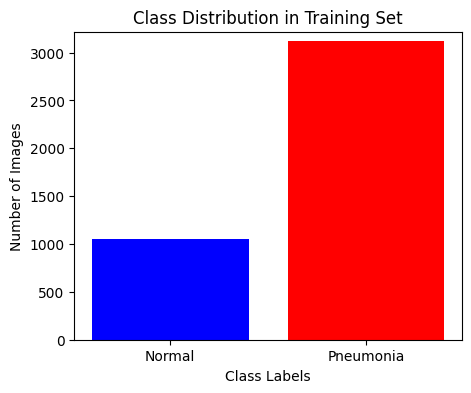

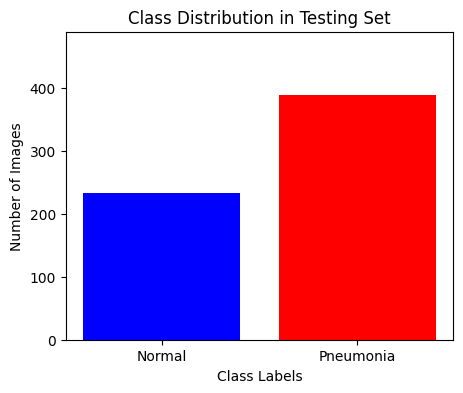

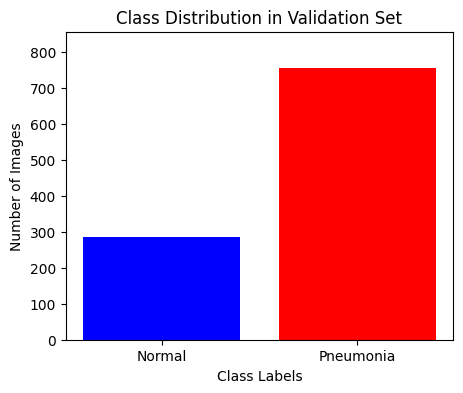

In [ ]:
#Path where data main folder stored
dataset_mainpath = "/content/chest_xray"

trainset_path = os.path.join(dataset_mainpath, "train")
testset_path = os.path.join(dataset_mainpath, "test")
valset_path = os.path.join(dataset_mainpath, "val")

for file in glob.glob(f"{dataset_mainpath}/**/.DS_Store", recursive=True): #remove .DS_Store files (macOS hidden files)
    os.remove(file)
    print(f"Deleted: {file}")

def load_and_label_data(data_path):
    """Loads image paths and labels into a DataFrame, filtering out non-image and corrupt files."""
    image_paths = []
    labels = []
    valid_extensions = (".jpeg", ".jpg", ".png")

    for label in ['NORMAL', 'PNEUMONIA']:
        folder_path = os.path.join(data_path, label)
        for filename in os.listdir(folder_path):
            file_path = os.path.join(folder_path, filename)
            if not filename.lower().endswith(valid_extensions):
                continue  # Skip non-image files

            # Verify if the image is valid
            try:
                with Image.open(file_path) as img:
                    img.verify()  # Verify image integrity
                image_paths.append(file_path)
                labels.append(0 if label == 'NORMAL' else 1)
            except Exception as e:
                print(f"Skipping corrupt image: {file_path}, Error: {e}")

    df = pd.DataFrame({'image_path': image_paths, 'label': labels})
    return df

train_df = load_and_label_data(trainset_path)
test_df = load_and_label_data(testset_path)
val_df = load_and_label_data(valset_path)

#Equalizing Train and Validation sets
train_df,val_df = train_test_split(train_df, test_size=0.2, random_state=42)

#Dataset statistics
print(f"Training set size: {len(train_df)}, Testing set size: {len(test_df)}, Validation set size: {len(val_df)}")

def plot_class_distribution(df, dataset_name):
    """Plots a bar graph for class distribution in a given dataset."""
    class_counts = df['label'].value_counts().sort_index()
    class_labels = ['Normal', 'Pneumonia']

    plt.figure(figsize=(5, 4))
    plt.bar(class_labels, class_counts, color=['blue', 'red'])
    plt.xlabel('Class Labels')
    plt.ylabel('Number of Images')
    plt.title(f'Class Distribution in {dataset_name} Set')
    plt.ylim(0, max(class_counts) + 100)
    plt.show()

plot_class_distribution(train_df, "Training")
plot_class_distribution(test_df, "Testing")
plot_class_distribution(val_df, "Validation")


#Step 3 - Data Preprocessing

After data handling, we will be preprocess the data. First, the dataset is imbalanced, to address this weighted random sampler used. Second, data augumentation techniques such as resizing, horizontal flip, normalization and applying image filter are adapted.

In [ ]:
#Device Initialization
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

#Data-Level Adjustment for class imbalance
labels = train_df['label'].values
class_weights = compute_class_weight(class_weight='balanced', classes=np.unique(labels), y=labels) #class weights
class_weights = torch.tensor(class_weights, dtype=torch.float).to(device)

#WeightedRandomSampler
sample_weights = np.array([class_weights[label].cpu() for label in labels])
sample_weights = torch.tensor(sample_weights, dtype=torch.float)
sampler = WeightedRandomSampler(weights=sample_weights, num_samples=len(sample_weights), replacement=True)

In [ ]:
class PneumoniaDataset(Dataset):
    def __init__(self, dataframe, transform=None):
        self.dataframe = dataframe
        self.transform = transform

    def __len__(self):
        return len(self.dataframe)

    def __getitem__(self, idx):
        image_path = self.dataframe.iloc[idx]['image_path']
        label = self.dataframe.iloc[idx]['label']
        image = Image.open(image_path).convert('RGB')

        if self.transform:
            image = self.transform(image)

        return image, label

class ApplyCLAHE(object):
    def __init__(self, clip_limit=2.0, tile_grid_size=(8, 8)):
        self.clip_limit = clip_limit
        self.tile_grid_size = tile_grid_size

    def __call__(self, img):
        img_np = np.array(img)
        if img_np.ndim == 3 and img_np.shape[2] == 3:
            img_np = cv2.cvtColor(img_np, cv2.COLOR_RGB2GRAY)
        clahe = cv2.createCLAHE(clipLimit=self.clip_limit, tileGridSize=self.tile_grid_size)
        img_clahe = clahe.apply(img_np)
        img_clahe = cv2.cvtColor(img_clahe, cv2.COLOR_GRAY2RGB)
        return Image.fromarray(img_clahe)

# Data augmentation for resnet scratch
transform_train_resnet = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.RandomHorizontalFlip(),
    ApplyCLAHE(),
    transforms.ToTensor(),
    transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])
])


# Data augmentation for resnet pretrained
transform_pretrain = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.RandomHorizontalFlip(),
    ApplyCLAHE(),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])


train_dataset = PneumoniaDataset(train_df, transform=transform_train_resnet)
val_dataset = PneumoniaDataset(val_df, transform=transform_train_resnet)
test_dataset = PneumoniaDataset(test_df, transform=transform_train_resnet)

train_dataset_2 = PneumoniaDataset(train_df, transform=transform_pretrain)
val_dataset_2 = PneumoniaDataset(val_df, transform=transform_pretrain)
test_dataset_2 = PneumoniaDataset(test_df, transform=transform_pretrain)

#DataLoaders
batch_size = 128

train_loader = DataLoader(train_dataset, batch_size=batch_size, sampler=sampler, num_workers=4)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=4)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False, num_workers=4)

train_loader_pretrain = DataLoader(train_dataset_2, batch_size=batch_size, sampler=sampler, num_workers=4)
val_loader_pretrain = DataLoader(val_dataset_2, batch_size=batch_size, shuffle=False, num_workers=4)
test_loader_pretrain = DataLoader(test_dataset_2, batch_size=batch_size, shuffle=False, num_workers=4)

#Step 5 - Model Initialization
Task 1.1 and Task 1.2

This is the important step in our experiment, model initialization. For tasks1.1 and 1.2 ResNet18 used as backbone model architecture. For first task, the model is trained from scratch i.e, random initialization of parameters and for second task, pretrained resnet model on ImageNet used which then finetuned for the downstream task.

In [ ]:
#Resnet scratch - ResNet-18 with random initialization
resnet18_scratch = models.resnet18(weights=None)
resnet18_scratch.fc = nn.Linear(resnet18_scratch.fc.in_features, 2)
resnet18 = resnet18_scratch.to(device)

criterion = nn.CrossEntropyLoss(weight=class_weights.to(device))
optimizer = optim.AdamW(resnet18.parameters(), lr=0.0001)
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', patience=3, factor=0.5)

#ResNet-18 pretrained on ImageNet
pretrained_model = models.resnet18(weights=ResNet18_Weights.IMAGENET1K_V1)
for param in pretrained_model.parameters():
    param.requires_grad = False
for param in pretrained_model.layer4.parameters():
    param.requires_grad = True

pretrained_model.fc = nn.Linear(pretrained_model.fc.in_features, 2)
pretrained_model = pretrained_model.to(device)
optimizer_ft = optim.Adam(pretrained_model.fc.parameters(), lr=0.0001)

#Step 6 - Model Training

In [ ]:
def train_model(model, train_loader, val_loader, criterion, optimizer, num_epochs=15):
    train_losses = []
    val_losses = []
    train_accuracies = []
    val_accuracies = []

    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model.to(device)

    for epoch in range(num_epochs):
        #Training Loop
        model.train()
        running_loss = 0.0
        train_correct = 0
        train_total = 0

        for images, labels in train_loader:
            images, labels = images.to(device), labels.to(device)
            optimizer.zero_grad()
            outputs = model(images)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()

            running_loss += loss.item()
            _, predicted = torch.max(outputs, 1)
            train_total += labels.size(0)
            train_correct += (predicted == labels).sum().item()

        train_loss = running_loss / len(train_loader)
        train_losses.append(train_loss)
        train_accuracy = 100 * train_correct / train_total
        train_accuracies.append(train_accuracy)

        #Validation Loop
        model.eval()
        val_loss = 0.0
        val_correct = 0
        val_total = 0

        with torch.no_grad():
            for images, labels in val_loader:
                images, labels = images.to(device), labels.to(device)
                outputs = model(images)
                loss = criterion(outputs, labels)
                val_loss += loss.item()

                _, predicted = torch.max(outputs, 1)
                val_total += labels.size(0)
                val_correct += (predicted == labels).sum().item()

        val_loss = val_loss / len(val_loader)
        val_losses.append(val_loss)
        val_accuracy = 100 * val_correct / val_total
        val_accuracies.append(val_accuracy)
        scheduler.step(val_loss)

        print(f"Epoch [{epoch+1}/{num_epochs}] "
              f"Train Loss: {train_loss} | Train Acc: {train_accuracy}% | "
              f"Val Loss: {val_loss} | Val Acc: {val_accuracy}%")

    return train_losses, val_losses, train_accuracies, val_accuracies

#calling train function for task1.1
print("Training - Task 1.1 - Scratch ResNet18 model")
train_losses_1, val_losses_1, train_acc_1, val_acc_1 = train_model(resnet18_scratch, train_loader, val_loader, criterion, optimizer, num_epochs=15)

Training - Task 1.1 - Scratch ResNet18 model
Epoch [1/15] Train Loss: 0.2193898610544927 | Train Acc: 87.176414189837% | Val Loss: 0.834809872839186 | Val Acc: 79.69348659003832%
Epoch [2/15] Train Loss: 0.06870941789538572 | Train Acc: 96.2607861936721% | Val Loss: 0.13016188641389212 | Val Acc: 95.78544061302682%
Epoch [3/15] Train Loss: 0.0384663539853963 | Train Acc: 98.17833173537872% | Val Loss: 0.09104539800642265 | Val Acc: 96.55172413793103%
Epoch [4/15] Train Loss: 0.02430378704924475 | Train Acc: 99.01725790987535% | Val Loss: 0.09059926708384107 | Val Acc: 96.74329501915709%
Epoch [5/15] Train Loss: 0.0178080805238675 | Train Acc: 99.20901246404603% | Val Loss: 0.12109064983410968 | Val Acc: 95.78544061302682%
Epoch [6/15] Train Loss: 0.023698255186900496 | Train Acc: 98.9693192713327% | Val Loss: 0.10621577004591624 | Val Acc: 96.83908045977012%
Epoch [7/15] Train Loss: 0.014717461012134498 | Train Acc: 99.44870565675934% | Val Loss: 0.06260980109477209 | Val Acc: 97.50957

In [ ]:
#calling train function for task 1.2
print("Training - Task 1.2 - Finetuning ResNet18")
train_losses_2, val_losses_2, train_acc_2, val_acc_2 = train_model(pretrained_model, train_loader_pretrain, val_loader_pretrain, criterion, optimizer_ft, num_epochs=15)

Training - Task 1.2 - Finetuning ResNet18
Epoch [1/15] Train Loss: 0.40049561858177185 | Train Acc: 69.91850431447747% | Val Loss: 0.5215048326386346 | Val Acc: 50.57471264367816%
Epoch [2/15] Train Loss: 0.21723713793537833 | Train Acc: 88.3509108341323% | Val Loss: 0.25353330704900956 | Val Acc: 85.53639846743295%
Epoch [3/15] Train Loss: 0.18651989553913925 | Train Acc: 89.6692233940556% | Val Loss: 0.1955609925919109 | Val Acc: 90.80459770114942%
Epoch [4/15] Train Loss: 0.15469453461242444 | Train Acc: 92.13806327900288% | Val Loss: 0.1834758793314298 | Val Acc: 91.57088122605364%
Epoch [5/15] Train Loss: 0.140843875931971 | Train Acc: 92.4496644295302% | Val Loss: 0.1771019904149903 | Val Acc: 91.37931034482759%
Epoch [6/15] Train Loss: 0.14745398655985342 | Train Acc: 92.76126558005753% | Val Loss: 0.198228657245636 | Val Acc: 89.75095785440612%
Epoch [7/15] Train Loss: 0.13461361148140646 | Train Acc: 92.88111217641419% | Val Loss: 0.15557051615582573 | Val Acc: 92.720306513409

#Step 7 - Model Evaluation(Testing)

In [ ]:
def evaluate_model(model, test_loader):
    model.eval()
    all_preds = []
    all_labels = []

    with torch.no_grad():
        for images, labels in test_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            _, predicted = torch.max(outputs, 1)
            all_preds.extend(predicted.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())

    return all_labels, all_preds

y_true_1, y_pred_1 = evaluate_model(resnet18_scratch, test_loader)
y_true_2, y_pred_2 = evaluate_model(pretrained_model, test_loader_pretrain)

accuracy_1 = accuracy_score(y_true_1, y_pred_1)
accuracy_2 = accuracy_score(y_true_2, y_pred_2)

print(f"Accuracy of Resnet Scratch: {accuracy_1:.4f}")
print(f"Accuracy of Pretrained ResNet18: {accuracy_2:.4f}")

Accuracy of Resnet Scratch: 0.7772
Accuracy of Pretrained ResNet18: 0.8750


#Step 8 - Results

Learning Curves

In [ ]:
def log_to_tensorboard(train_losses, val_losses, train_accuracies, val_accuracies, model_name, writer, epoch):
    writer.add_scalar(f'{model_name}/Train/Loss', train_losses[epoch], epoch)
    writer.add_scalar(f'{model_name}/Val/Loss', val_losses[epoch], epoch)

    writer.add_scalar(f'{model_name}/Train/Accuracy', train_accuracies[epoch], epoch)
    writer.add_scalar(f'{model_name}/Val/Accuracy', val_accuracies[epoch], epoch)

def plot_training_to_tensorboard(train_losses, val_losses, train_accuracies, val_accuracies, model_name):
    writer = SummaryWriter(log_dir=f'runs/{model_name}')

    for epoch in range(len(train_losses)):
        log_to_tensorboard(train_losses, val_losses, train_accuracies, val_accuracies, model_name, writer, epoch)

    writer.close()


plot_training_to_tensorboard(train_losses_1, val_losses_1, train_acc_1, val_acc_1, "Resnet_from_scratch")
plot_training_to_tensorboard(train_losses_2, val_losses_2, train_acc_2, val_acc_2, "Resnet_Pretrained")

In [ ]:
%load_ext tensorboard
%tensorboard --logdir /content/runs

<IPython.core.display.Javascript object>

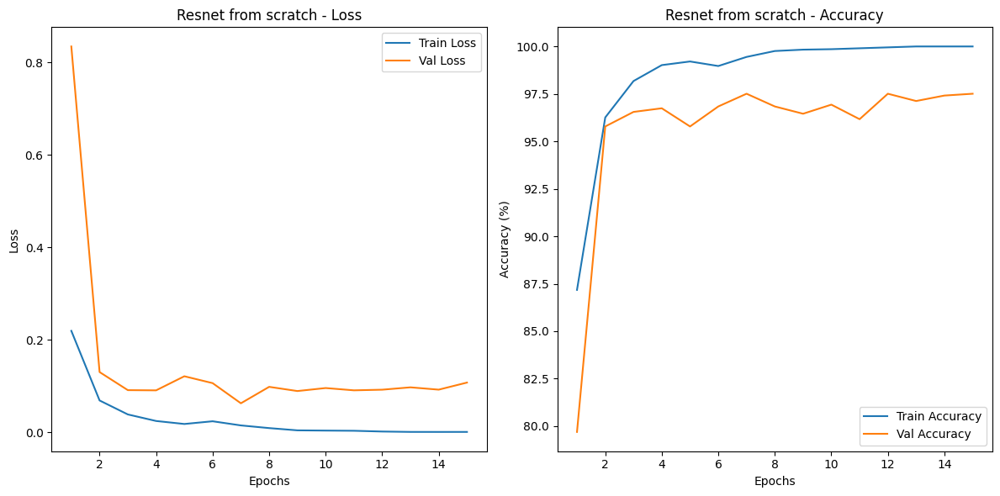

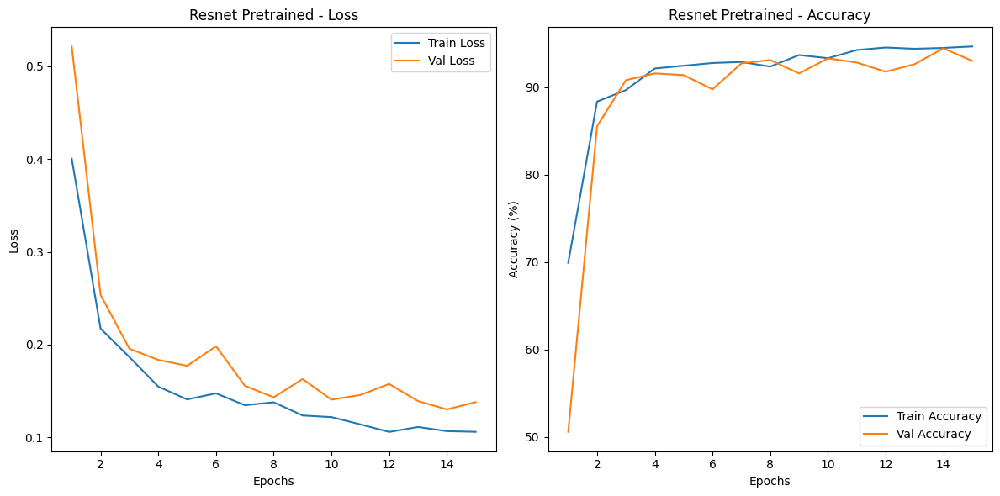

In [ ]:
def plot_training(train_losses, val_losses, train_accuracies, val_accuracies, model_name):
    epochs = range(1, len(train_losses) + 1)

    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.plot(epochs, train_losses, label='Train Loss')
    plt.plot(epochs, val_losses, label='Val Loss')
    plt.title(f'{model_name} - Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()

    plt.subplot(1, 2, 2)
    plt.plot(epochs, train_accuracies, label='Train Accuracy')
    plt.plot(epochs, val_accuracies, label='Val Accuracy')
    plt.title(f'{model_name} - Accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy (%)')
    plt.legend()

    plt.tight_layout()
    plt.show()

plot_training(train_losses_1, val_losses_1, train_acc_1, val_acc_1, "Resnet from scratch")
plot_training(train_losses_2, val_losses_2, train_acc_2, val_acc_2, "Resnet Pretrained")

Classification Report & Confusion Matrix

Classification Report for ResNet Scratch:
              precision    recall  f1-score   support

           0       0.99      0.41      0.58       234
           1       0.74      1.00      0.85       390

    accuracy                           0.78       624
   macro avg       0.86      0.70      0.71       624
weighted avg       0.83      0.78      0.75       624

Classification Report for Pretrained ResNet18:
              precision    recall  f1-score   support

           0       0.85      0.80      0.83       234
           1       0.89      0.92      0.90       390

    accuracy                           0.88       624
   macro avg       0.87      0.86      0.86       624
weighted avg       0.87      0.88      0.87       624

Confusion Matrix for ResNet Scratch:
Confusion Matrix for ResNet Pretrained:


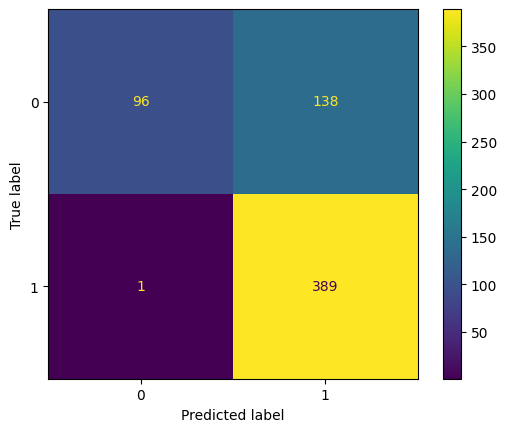

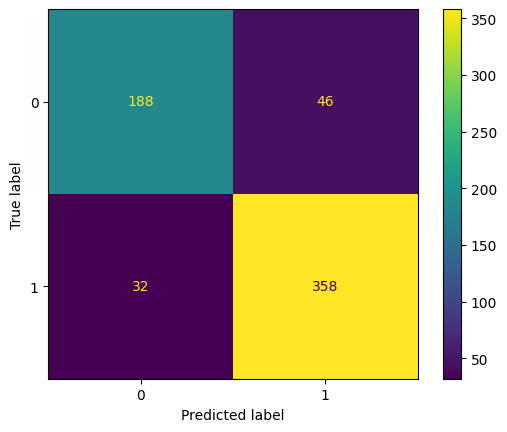

In [ ]:
print("Classification Report for ResNet Scratch:")
print(classification_report(y_true_1, y_pred_1))
print("Classification Report for Pretrained ResNet18:")
print(classification_report(y_true_2, y_pred_2))

# Confusion Matrix
print("Confusion Matrix for ResNet Scratch:")
Mat_1 = confusion_matrix(y_true_1, y_pred_1)
ConfusionMatrixDisplay(Mat_1).plot()

print("Confusion Matrix for ResNet Pretrained:")
Mat_2 = confusion_matrix(y_true_2, y_pred_2)
ConfusionMatrixDisplay(Mat_2).plot()

Visualization - Misclassification

Grad-CAM on Misclassified Images on ResNet Scratch model:


/usr/local/lib/python3.11/dist-packages/torch/nn/modules/module.py:1827: FutureWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  self._maybe_warn_non_full_backward_hook(args, result, grad_fn)


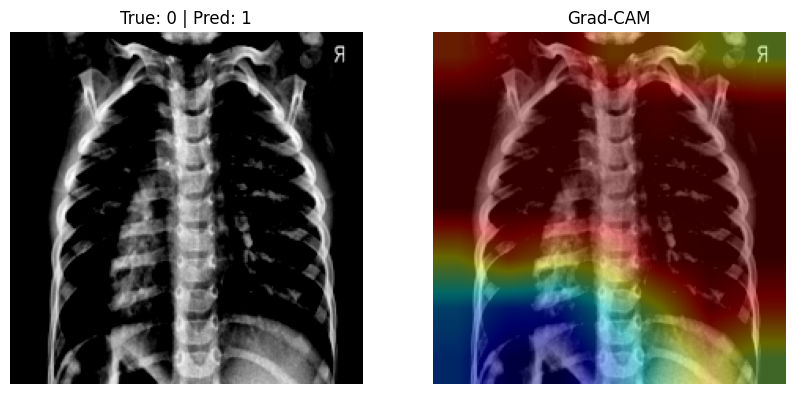

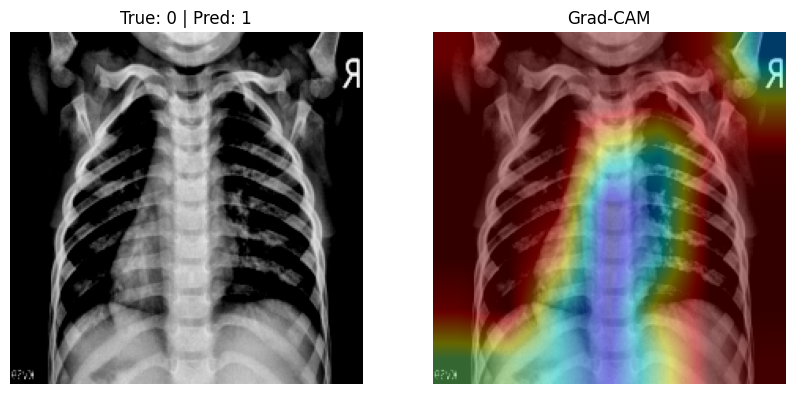

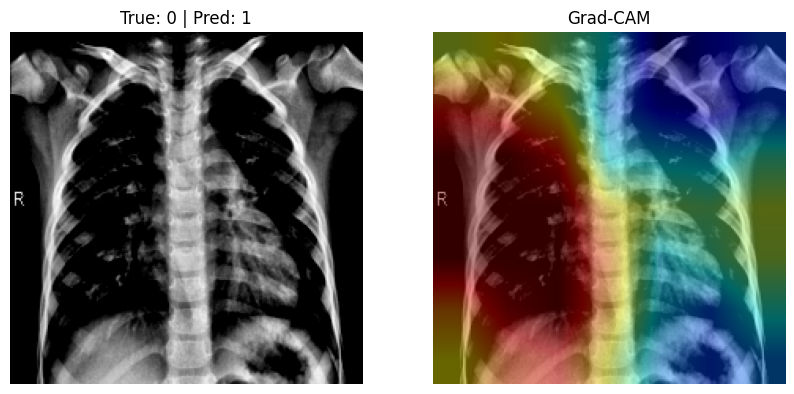

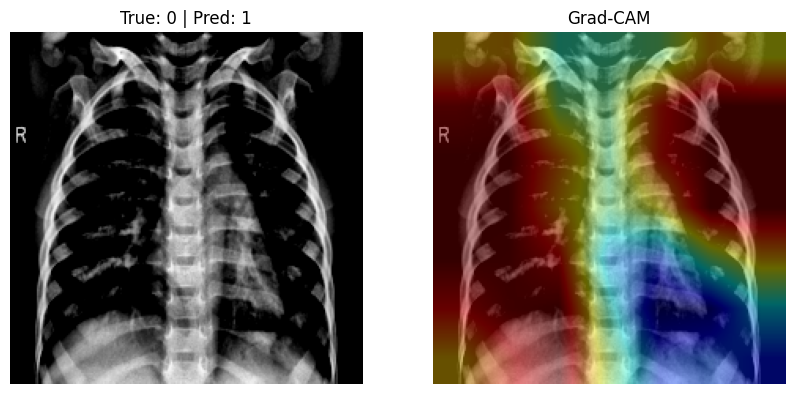

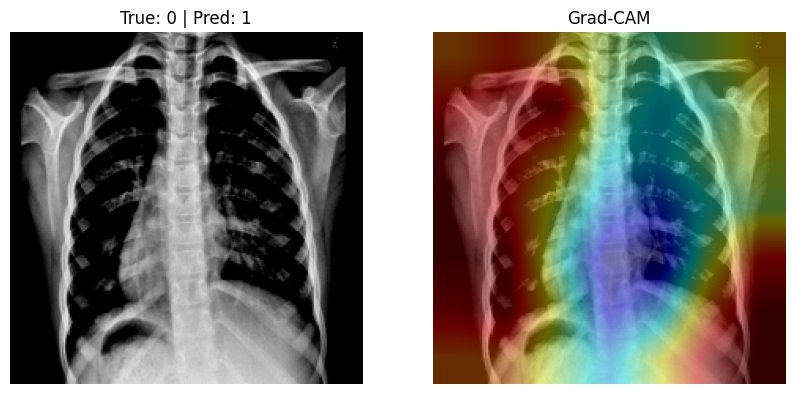

Grad-CAM on Misclassified Images on Pretrained ResNet18 model:


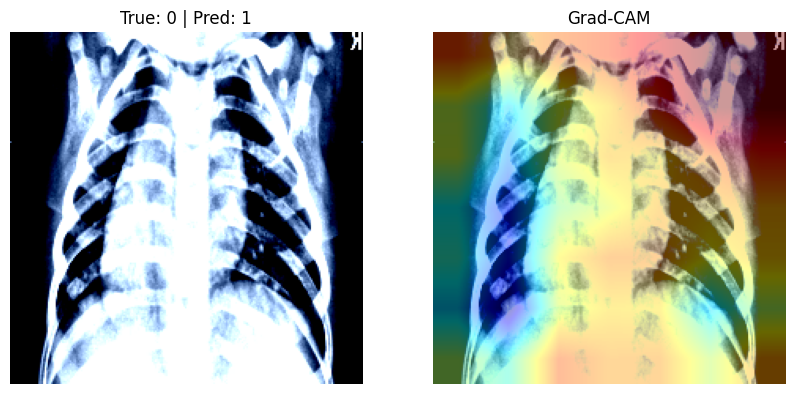

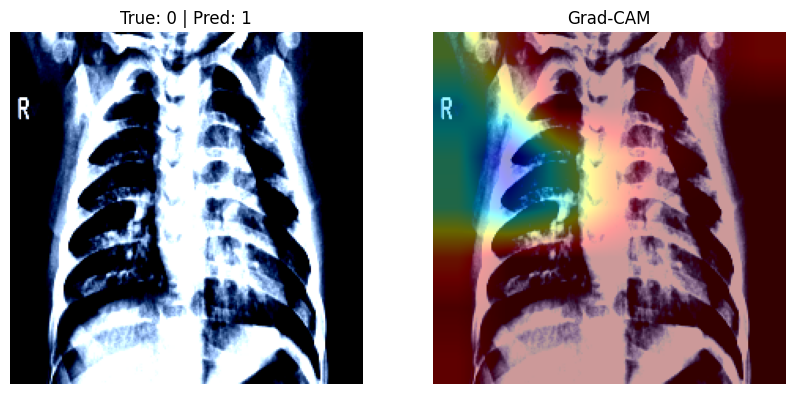

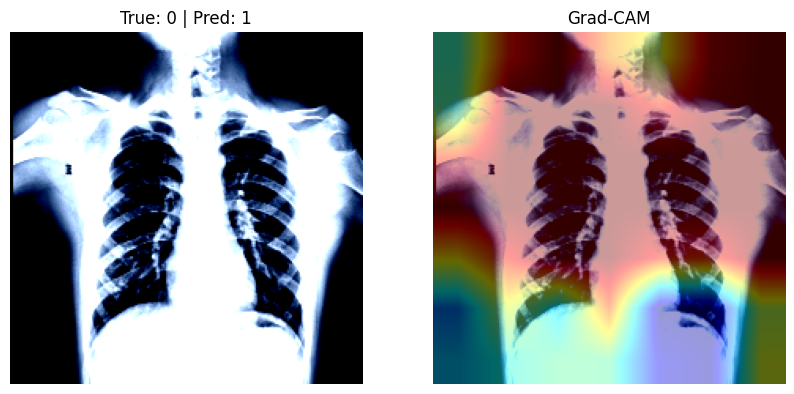

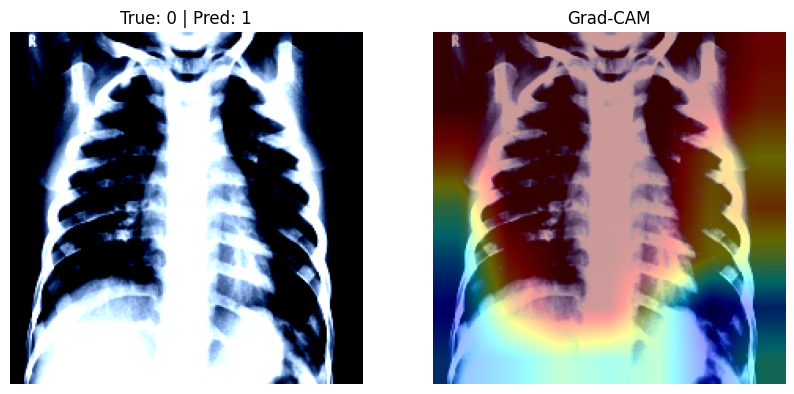

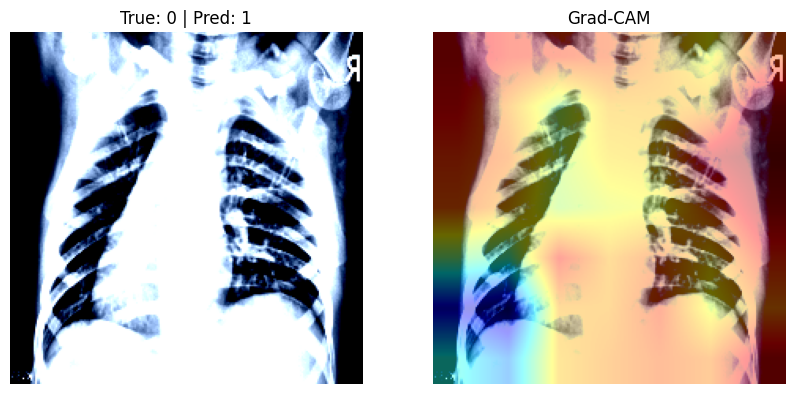

In [ ]:
def register_hooks(model):
    """
    Register hooks to get the gradients and activations from the last convolutional layer
    """
    activations = {}
    gradients = {}

    def save_activation(name):
        def hook(model, input, output):
            activations[name] = output
        return hook

    def save_gradient(name):
        def hook(model, input, output):
            gradients[name] = output[0]
        return hook

    model.layer4[1].register_forward_hook(save_activation("layer4"))
    model.layer4[1].register_backward_hook(save_gradient("layer4"))

    return activations, gradients

def generate_gradcam(activations, gradients, index, image):
    """
    Generate Grad-CAM heatmap for a given image and index
    """
    grads = gradients["layer4"]
    act = activations["layer4"]

    weights = F.adaptive_avg_pool2d(grads, 1)
    weights = weights.view(weights.size(0), -1)

    grad_cam = torch.matmul(weights, act.view(act.size(1), -1))
    grad_cam = grad_cam.view(act.size(2), act.size(3))

    grad_cam = F.relu(grad_cam)

    grad_cam = grad_cam - grad_cam.min()
    grad_cam = grad_cam / grad_cam.max()

    return grad_cam.detach().cpu().numpy()

def show_grad_cam_on_misclassified_images(test_loader, model, y_true, y_pred):
    """
    Show Grad-CAM visualizations on misclassified images from the test set
    """
    model.eval()
    activations, gradients = register_hooks(model)

    misclassified_indices = [i for i in range(len(y_true)) if y_true[i] != y_pred[i]]

    for idx in misclassified_indices[:5]:
        image, label = test_loader.dataset[idx]
        image = image.unsqueeze(0).to(device)

        model.zero_grad()
        output = model(image)
        output[0, y_pred[idx]].backward()

        grad_cam = generate_gradcam(activations, gradients, y_pred[idx], image)

        image = image.squeeze(0).cpu().numpy().transpose(1, 2, 0)
        image = np.uint8(np.clip(image * 255, 0, 255))
        heatmap = cv2.resize(grad_cam, (image.shape[1], image.shape[0]))
        heatmap = np.uint8(255 * heatmap)

        heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
        superimposed_img = cv2.addWeighted(image, 0.6, heatmap, 0.4, 0)


        plt.figure(figsize=(10, 5))
        plt.subplot(1, 2, 1)
        plt.imshow(image)
        plt.title(f"True: {y_true[idx]} | Pred: {y_pred[idx]}")
        plt.axis('off')

        plt.subplot(1, 2, 2)
        plt.imshow(superimposed_img)
        plt.title("Grad-CAM")
        plt.axis('off')

        plt.show()

print("Grad-CAM on Misclassified Images on ResNet Scratch model:")
show_grad_cam_on_misclassified_images(test_loader, resnet18_scratch, y_true_1, y_pred_1)
print("Grad-CAM on Misclassified Images on Pretrained ResNet18 model:")
show_grad_cam_on_misclassified_images(test_loader_pretrain, pretrained_model, y_true_2, y_pred_2)